In [1]:
#%% import modules
import os
import pandas as pd
#from sep_util import read_file
import numpy as np
from dateutil import parser
import obspy
import statsmodels.api as sm

import sys
sys.path.append('../')
from utility.general import mkdir
from utility.processing import remove_outliers, filter_event_first_order

import seaborn as sns

# Plotting
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# %matplotlib inline
params = {
    'image.interpolation': 'nearest',
    'image.cmap': 'gray',
    'savefig.dpi': 300,  # to adjust notebook inline plot size
    'axes.labelsize': 18, # fontsize for x and y labels (was 10)
    'axes.titlesize': 18,
    'font.size': 18,
    'legend.fontsize': 18,
    'xtick.labelsize': 18,
    'ytick.labelsize': 18,
    'text.usetex':False,
    'axes.facecolor': 'white',
    'savefig.facecolor': 'white',
    'pdf.fonttype': 42 # Turn off text conversion to outlines
}
matplotlib.rcParams.update(params)
import pygmt

In [2]:
#%% 
# Combine all regions (Ridgecrest + Mammoth N and S)
# Specify the file names
data_file_CA = '../data_files/peak_amplitude/peak_amplitude_multiple_arrays.csv'
data_file_Sanriku = '../data_files/peak_amplitude/peak_amplitude_Sanriku.csv'
# Combined all data 
peak_amplitude_df_all = pd.read_csv(data_file_CA)
peak_amplitude_df_sanriku = pd.read_csv(data_file_Sanriku)
peak_amplitude_df_sanriku = filter_event_first_order(peak_amplitude_df_sanriku, snr_threshold=5, M_threshold=[2, 10], min_channel=100)
peak_amplitude_df_all = pd.concat((peak_amplitude_df_all, peak_amplitude_df_sanriku), axis=0, ignore_index=True)

# load the peak amplitude data
# use the hypocentral distance instead of epicentral distance
peak_amplitude_df_all['distance_in_km'] = peak_amplitude_df_all['calibrated_distance_in_km']

# some event filtering
peak_amplitude_df_all = peak_amplitude_df_all[['event_id', 'magnitude', 'depth_km', 'channel_id', 'distance_in_km', 
                                    'snrP', 'snrS', 'peak_P', 'peak_S', 'region']] #, 'combined_channel_id', 'event_label', 'region_site'
# to remove some extreme values
peak_amplitude_df_all = remove_outliers(peak_amplitude_df_all, outlier_value=1e4)
peak_amplitude_df_all = peak_amplitude_df_all.drop(index=peak_amplitude_df_all[peak_amplitude_df_all.peak_P<=0].index)
peak_amplitude_df_all = peak_amplitude_df_all.drop(index=peak_amplitude_df_all[peak_amplitude_df_all.peak_S<=0].index)


In [3]:
#%%
figure_output_dir = '../data_figures'
mkdir(figure_output_dir)

region_label = ['ridgecrest', 'mammothN', 'mammothS', 'sanriku']

catalog_list = ['../data_files/catalogs/catalog_Ridgecrest.csv', '../data_files/catalogs/catalog_LongValley_N.csv', 
                '../data_files/catalogs/catalog_LongValley_S.csv', '../data_files/catalogs/catalog_Sanriku.csv']

das_info_list = ['../data_files/das_info/das_info_Ridgecrest.csv', '../data_files/das_info/das_info_LongValley_N.csv', 
                '../data_files/das_info/das_info_LongValley_S.csv', '../data_files/das_info/das_info_Sanriku.csv']


region_legend_text = ['Ridgecrest', 'Long Valley N', 'Long Valley S', 'Sanriku'] 

In [4]:
#%% 
# events to show
event_id_selected = np.unique(peak_amplitude_df_all['event_id'])

DAS_info_all = pd.DataFrame(columns=['index', 'latitude', 'longitude', 'elevation_m'])
catalog_select_all = pd.DataFrame(columns=['event_id', 'event_time', 'longitude', 'latitude','depth_km','magnitude','magnitude_type','source', 'region'])
for i_region in range(len(region_label)):

    DAS_info_files = das_info_list[i_region]
    catalog_file =  catalog_list[i_region] 

    #  load the information about the DAS channel
    DAS_info = pd.read_csv(DAS_info_files)
    DAS_info_all = pd.concat((DAS_info_all, DAS_info), axis=0, ignore_index=True)

    catalog = pd.read_csv(catalog_file)
    # Find events in the pick file
    catalog_select = catalog[catalog.event_id.isin(event_id_selected)]
    catalog_select['region'] = region_label[i_region]
    catalog_select_all = pd.concat((catalog_select_all, catalog_select), axis=0, ignore_index=True)

DAS_channel_num = DAS_info_all.shape[0]
DAS_index = DAS_info_all['index'].astype('int')
DAS_lon = DAS_info_all.longitude
DAS_lat = DAS_info_all.latitude

num_events = catalog_select_all.shape[0]
event_lon = catalog_select_all.longitude
event_lat = catalog_select_all.latitude
event_id = catalog_select_all.event_id

#%%
# drop the clipped one
catalog_select_all = catalog_select_all.drop(index=catalog_select_all[catalog_select_all.event_id == 4130].index)

temp_peak = peak_amplitude_df_all.groupby(['event_id', 'region']).median().reset_index()
temp_peak = temp_peak.drop(index=temp_peak[temp_peak.event_id == 4130].index)

/tmp/ipykernel_3025148/2801619594.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  catalog_select['region'] = region_label[i_region]
/tmp/ipykernel_3025148/2801619594.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  catalog_select['region'] = region_label[i_region]
/tmp/ipykernel_3025148/2801619594.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pa

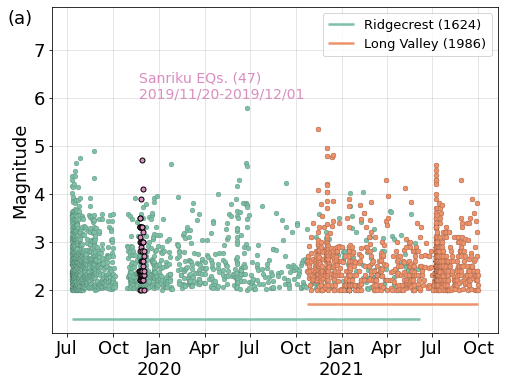

In [5]:
#%%
# plot time variation of events
time_list = [obspy.UTCDateTime(parser.parse(time)) for time in catalog_select_all.event_time]
time_list_datetime = np.array([obspy.UTCDateTime(parser.parse(time)).datetime for time in catalog_select_all.event_time])
time_span = np.array([time-time_list[0] for time in time_list])
time_span_days = time_span/3600/24

fig, ax = plt.subplots(figsize=(8, 6))

locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator, zero_formats=['', '%b\n%Y', '%b', '%b-%d', '%H:%M', '%H:%M'])
ax.xaxis.set_major_formatter(formatter)
ax.xaxis.set_major_locator(locator)

# Ridgecrest
ii_RC = catalog_select_all['region'] == 'ridgecrest'
ax.plot(time_list_datetime[ii_RC], catalog_select_all[ii_RC].magnitude, 'o', markersize=5, markeredgecolor='k', markeredgewidth=.1, color='#7DC0A6')
# ax.plot(time_span_days[ii_RC], catalog_select_all[ii_RC].magnitude, 'o', markersize=3, color='#7DC0A6')

# LV
ii_LV = (catalog_select_all['region'] == 'mammothN') | (catalog_select_all['region'] == 'mammothS')
ax.plot(time_list_datetime[ii_LV], catalog_select_all[ii_LV].magnitude, 'o', markersize=5, markeredgecolor='k', markeredgewidth=.1, color='#ED926B')

# Sanriku
ii_sanriku = catalog_select_all['region'] == 'sanriku'
ax.plot(time_list_datetime[ii_sanriku], catalog_select_all[ii_sanriku].magnitude, 'o', color='#DA8EC0', markersize=5, markeredgecolor='k', markeredgewidth=1,)
ax.text(time_list_datetime[ii_sanriku][0], 6., f'Sanriku EQs. ({len(time_span_days[ii_sanriku])}) \n2019/11/20-2019/12/01', color='#DA8EC0', fontsize=14)

ax.hlines(y=1.4, xmin=time_list_datetime[ii_RC][0], xmax=time_list_datetime[ii_RC][-1], color='#7DC0A6', label=f'Ridgecrest ({len(time_span_days[ii_RC])})', linewidth=2.5)
ax.hlines(y=1.7, xmin=time_list_datetime[ii_LV][0], xmax=time_list_datetime[ii_LV][-1], color='#ED926B', label=f'Long Valley ({len(time_span_days[ii_LV])})', linewidth=2.5)
ax.legend(loc=1,fontsize=13)
# ax.set_xlabel(f'Days from the {time_list[0].isoformat()[:10]}')
ax.set_ylabel('Magnitude')
ax.set_ylim(ymin=1.1, ymax=7.9)
ax.annotate(f'(a)', xy=(-0.1, 0.95), xycoords=ax.transAxes, fontsize=18)
ax.grid(alpha=0.4)
plt.savefig(figure_output_dir + '/time_variation_selected_earthquakes.pdf', bbox_inches='tight')

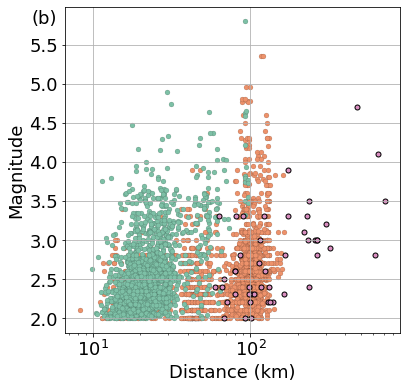

In [6]:
#%%
# plot magnitude and distance figure
fig, ax = plt.subplots(figsize=(6, 6))
color_list = ['#DA8EC0', '#7DC0A6', '#ED926B', '#ED926B']
for ii_region, region in enumerate(temp_peak.region.unique()):
    ii_temp = temp_peak.region == region
    if region == 'sanriku':
        ax.plot(temp_peak[ii_temp].distance_in_km, temp_peak[ii_temp].magnitude, 'o', color=color_list[ii_region], 
                markeredgecolor='k', markeredgewidth=1, markersize=5, zorder=-ii_region)
    else:
        ax.plot(temp_peak[ii_temp].distance_in_km, temp_peak[ii_temp].magnitude, 'o', color=color_list[ii_region], 
                markeredgecolor='k', markeredgewidth=0.1, markersize=5, zorder=-ii_region, alpha=1)

ax.set_xscale('log')
ax.set_xlabel('Distance (km)')
ax.set_ylabel('Magnitude')
ax.grid()
ax.annotate(f'(b)', xy=(-0.1, 0.95), xycoords=ax.transAxes, fontsize=18)
plt.savefig(figure_output_dir + '/distance_vs_magnitude.pdf', bbox_inches='tight')

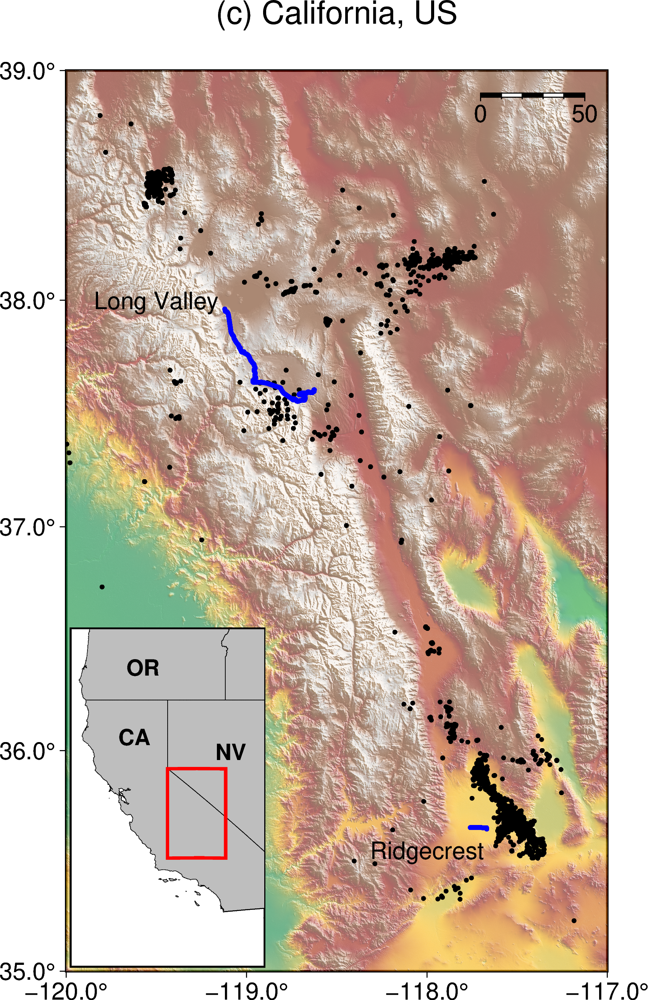

In [7]:
#%%
# =========================  Plot both arrays in California with PyGMT ==============================
gmt_region = [-120, -117, 35, 39]

projection = "M12c"
grid = pygmt.datasets.load_earth_relief(resolution="03s", region=gmt_region)

# calculate the reflection of a light source projecting from west to east
dgrid = pygmt.grdgradient(grid=grid, radiance=[270, 30])

fig = pygmt.Figure()
# define figure configuration
pygmt.config(FORMAT_GEO_MAP="ddd.x", MAP_FRAME_TYPE="plain", FONT_ANNOT_PRIMARY=15, FONT_TITLE="20p,Helvetica,black")

# --------------- plotting the original Data Elevation Model -----------
fig.basemap(region=gmt_region, 
projection=projection, 
frame=['WSrt+t"(c) California, US"', "xa1.0x+lLongitude", "ya1.0y+lLatitude"],
map_scale="jTR+w50k+o0.5c/0.5c+f"
)
pygmt.makecpt(cmap="dem4", series=[-1000, 3000]) #
fig.grdimage(
    grid=grid,
    projection=projection,
    cmap=True,
    shading='+a45+nt1',
    transparency=40
)

fig.basemap(
map_scale="jTR+w50k+o0.5c/0.5c+f"
)

fig.plot(x=catalog_select_all.longitude.astype('float'), y=catalog_select_all.latitude.astype('float'), style="c0.1c", color="black")
fig.plot(x=DAS_info_all.longitude[::10].astype('float'), y=DAS_info_all.latitude[::10].astype('float'), style="c0.1c", color="blue")

fig.text(text="Long Valley", x=-119.5, y=38)
fig.text(text="Ridgecrest", x=-118, y=35.55)

fig.text(text="(c)", x=-120.5, y=39.3)

# Create an inset map
with fig.inset(position="jBL+w4.3c/7.5c+o0.1c", box="+gwhite+p1p"):
    fig.coast(
        region=[-125, -115, 30, 45],
        projection="J",
        #land='gray',#
        dcw="US+ggray+p0.2p",
        #water='lightblue',
        area_thresh=10000,
        resolution='f',
        borders=["1/0.5p,black", "2/0.25p,black"]
    )
    # Plot a rectangle ("r") in the inset map to show the area of the main
    # figure. 
    rectangle = [[gmt_region[0], gmt_region[2], gmt_region[1], gmt_region[3]]]
    fig.plot(data=rectangle, style="r+s", pen="2p,red")

    # Define the state names and their positions
    state_names = {"CA": [-123, 40], "NV": [-118, 39.34], "OR": [-122.59, 43.00]}

    # Add the state names to the map
    for state, position in state_names.items():
        fig.text(x=position[0], y=position[1], text=state, font="14p,Helvetica-Bold,black", justify="LM", offset="0.2c")

fig.show()
fig.savefig(figure_output_dir + '/map_of_earthquakes_CA_GMT.png')
# fig.savefig(figure_output_dir + '/map_of_earthquakes_CA_GMT.pdf')

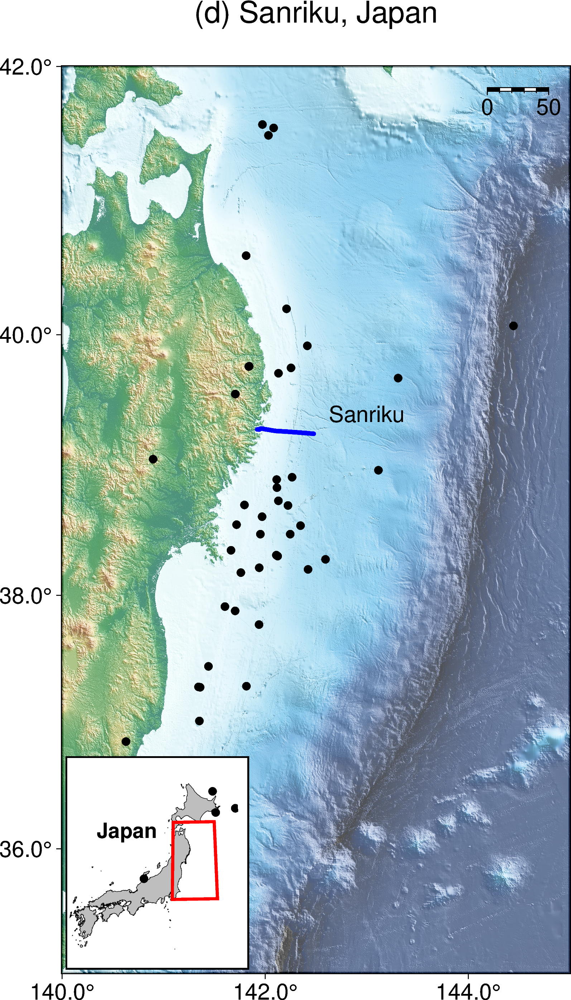

In [8]:
#%%
# =========================  Plot Sanriku in Japan with PyGMT ==============================
#  load the information about the DAS channel
DAS_info_sanriku = pd.read_csv('/kuafu/EventData/Sanriku_ERI/das_info.csv')

gmt_region = [140, 145, 35, 42]
projection = "M12c"
grid = pygmt.datasets.load_earth_relief(resolution="03s", region=gmt_region)

# calculate the reflection of a light source projecting from west to east
dgrid = pygmt.grdgradient(grid=grid, radiance=[270, 30])

fig = pygmt.Figure()
# define figure configuration
pygmt.config(FORMAT_GEO_MAP="ddd.x", MAP_FRAME_TYPE="plain", FONT_ANNOT_PRIMARY=15, FONT_TITLE="20p,Helvetica,black")

# --------------- plotting the original Data Elevation Model -----------
fig.basemap(region=gmt_region, 
projection=projection, 
frame=['WSrt+t" (d) Sanriku, Japan"', "xa2.0x+lLongitude", "ya2.0y+lLatitude"]
)

pygmt.makecpt(cmap="geo", series=[-8000, 8000])
fig.grdimage(
    grid=grid,
    projection=projection,
    cmap=True,
    shading='+a45+nt1',
    transparency=30
)

fig.basemap(
map_scale="jTR+w50k+o0.5c/0.5c+f"
)

fig.plot(x=catalog_select_all.longitude.astype('float'), y=catalog_select_all.latitude.astype('float'), style="c0.15c", color='blue')
fig.plot(x=catalog_select_all.longitude.astype('float'), y=catalog_select_all.latitude.astype('float'), style="c0.2c", color="black")

# show the clipped 4130 event
# event_4130 = catalog_select_all[catalog_select_all.event_id == 4130]
# fig.plot(x=event_4130.longitude.astype('float'), y=event_4130.latitude.astype('float'), style="c0.22c", color="red")
# fig.text(text="4130", x=event_4130.longitude.astype('float')+0.15, y=event_4130.latitude.astype('float'),color="red")

fig.plot(x=DAS_info_sanriku.longitude[:10000:100].astype('float'), y=DAS_info_sanriku.latitude[:10000:100].astype('float'), style="c0.1c", color="blue")

fig.text(text="Sanriku", x=143, y=39.4)

with fig.inset(position="jBL+w4.3c/5.0c+o0.1c", box="+gwhite+p1p"):
    # Plot the Japan main land in the inset using coast. 
    fig.coast(
        region=[129, 148, 30, 46],
        projection="U54S/?",
        #land='gray',#
        dcw="JP+ggray+p0.2p",
        #water='lightblue',
        area_thresh=10000,
        resolution='f',
        #borders=["1/0.5p,black", "2/0.25p,black"]
    )
    # Plot a rectangle ("r") in the inset map 
    rectangle = [[gmt_region[0], gmt_region[2], gmt_region[1], gmt_region[3]]]
    fig.plot(data=rectangle, style="r+s", pen="2p,red")
    ii_outside = catalog_select_all.event_id.isin(temp_peak[temp_peak.distance_in_km>400].event_id)
    fig.plot(x=catalog_select_all[ii_outside].longitude.astype('float'), y=catalog_select_all[ii_outside].latitude.astype('float'), style="c0.2c", color="black")
    fig.text(x=130, y=40, text='Japan', font="14p,Helvetica-Bold,black", justify="LM", offset="0.2c")

fig.show()
fig.savefig(figure_output_dir + '/map_of_earthquakes_JP_GMT.png')
# fig.savefig(figure_output_dir + '/map_of_earthquakes_JP_GMT.pdf')

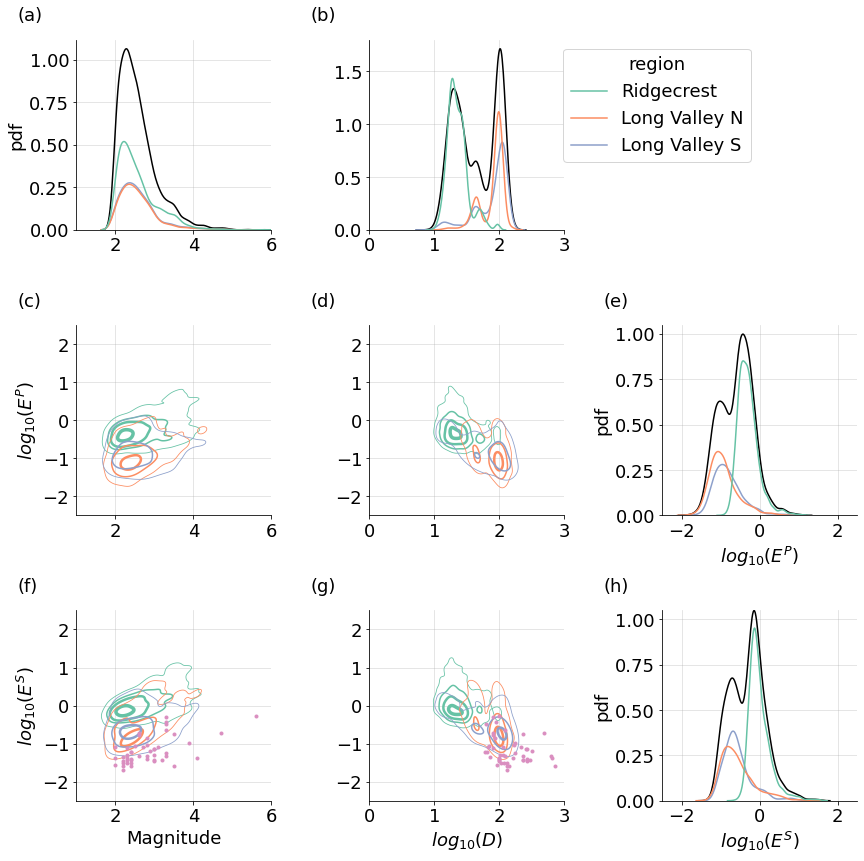

In [9]:
# %%
# =================================   New organization of data statistics (3 by 3) Contour plot =================================  
# =================================   Merge events  =================================  
levels = [0.05, 0.3, 0.6, 0.9]
linewidths = [0.8, 1.5, 2.5, 3.5]
thresh = 0.01

bins = (10, 10)
add_possible_clipping = False
peak_amplitude_df_temp = peak_amplitude_df_all.iloc[::1, :]
peak_amplitude_df_temp = peak_amplitude_df_temp.groupby(by=['event_id', 'region'], as_index=False).median()

calibrated_distance = ''#'_calibrated_distance'
peak_amplitude_df_temp['log10(distance)'] = np.log10(peak_amplitude_df_temp.distance_in_km.astype('float'))
# peak_amplitude_df_temp['log10(distance)'] = np.log10(peak_amplitude_df_temp.distance_in_km.astype('float'))
peak_amplitude_df_temp['log10(peak_P)'] = np.log10(peak_amplitude_df_temp.peak_P.astype('float'))
peak_amplitude_df_temp['log10(peak_S)'] = np.log10(peak_amplitude_df_temp.peak_S.astype('float'))
peak_amplitude_df_temp['P/S'] = peak_amplitude_df_temp.peak_P/peak_amplitude_df_temp.peak_S

peak_amplitude_df_Sanriku = peak_amplitude_df_temp[peak_amplitude_df_temp.region == 'sanriku']
peak_amplitude_df_others = peak_amplitude_df_temp[peak_amplitude_df_temp.region != 'sanriku']

plt.close('all')
matplotlib.rcParams.update(params)
fig, ax = plt.subplots(3, 3, figsize=(14, 14))
gca = ax[0, 0]
g = sns.kdeplot(ax=gca, data=peak_amplitude_df_others[['magnitude', 'region']], x='magnitude', color='k')
g = sns.kdeplot(ax=gca, data=peak_amplitude_df_others[['magnitude', 'region']], x='magnitude', hue='region', palette='Set2', legend=False)
gca.set_xlim(1, 6)
gca.set_ylabel('pdf')
gca.grid(alpha=0.4)

gca = ax[0, 1]
g = sns.kdeplot(ax=gca, data=peak_amplitude_df_others[['log10(distance)', 'region']], x='log10(distance)', color='k')
g = sns.kdeplot(ax=gca, data=peak_amplitude_df_others[['log10(distance)', 'region']], x='log10(distance)', hue='region', palette='Set2', legend=False)
gca.set_xlim(0, 3)
gca.grid(alpha=0.4)

gca = ax[1, 0]
g = sns.kdeplot(ax=gca, data=peak_amplitude_df_others[['magnitude','log10(peak_P)', 'region']], x='magnitude', y='log10(peak_P)',
                 hue='region', palette='Set2', alpha=1, cbar=False, legend=True, fill=False, levels=levels, thresh=thresh, linewidths=linewidths)
gca.set_ylim(-2.5, 2.5)
gca.set_ylabel('$log_{10}(E^P)$')
gca.grid(alpha=0.4)
g.get_legend().set_bbox_to_anchor((3.5, 2.5))
# update the legend text
L = g.get_legend()
for i_L in range(len(L.get_texts())):
    L.get_texts()[i_L].set_text(region_legend_text[i_L])

gca = ax[1, 1]
g = sns.kdeplot(ax=gca, data=peak_amplitude_df_others[['log10(distance)','log10(peak_P)', 'region']], x='log10(distance)', y='log10(peak_P)',
                 hue='region', palette='Set2', alpha=1, cbar=False, legend=False, levels=levels, thresh=thresh, linewidths=linewidths)
gca.grid(alpha=0.4)

gca = ax[2, 0]
g = sns.kdeplot(ax=gca, data=peak_amplitude_df_others[['magnitude','log10(peak_S)', 'region']], x='magnitude', y='log10(peak_S)',
                 hue='region', palette='Set2', alpha=1, cbar=False, legend=False, levels=levels, thresh=thresh, linewidths=linewidths)
gca.plot(peak_amplitude_df_Sanriku.magnitude.astype('float'), np.log10(peak_amplitude_df_Sanriku.peak_S.astype('float')), 'o', markersize=3, color='#DA8EC0', alpha=1)
gca.set_ylim(-2.5, 2.5)
gca.set_ylabel('$log_{10}(E^S)$')
gca.set_xlabel('Magnitude')
gca.grid(alpha=0.4)


gca = ax[2, 1]
g = sns.kdeplot(ax=gca, data=peak_amplitude_df_others[['log10(distance)','log10(peak_S)', 'region']], x='log10(distance)', y='log10(peak_S)',
                 hue='region', palette='Set2', alpha=1, cbar=False, legend=False, levels=levels, thresh=thresh, linewidths=linewidths)
gca.plot(np.log10(peak_amplitude_df_Sanriku.distance_in_km.astype('float')), np.log10(peak_amplitude_df_Sanriku.peak_S.astype('float')), 'o', markersize=3, color='#DA8EC0', alpha=1)
gca.set_xlabel('$log_{10}(D)$')
fig.delaxes(ax[0, 2])
gca.grid(alpha=0.4)

gca = ax[1, 2]
g = sns.kdeplot(ax=gca, data=peak_amplitude_df_others[['log10(peak_P)', 'region']], x='log10(peak_P)', color='k')
g = sns.kdeplot(ax=gca, data=peak_amplitude_df_others[['log10(peak_P)', 'region']], x='log10(peak_P)', hue='region', palette='Set2', legend=False)
gca.set_xlim(-2.5, 2.5)
gca.set_xlabel('$log_{10}(E^P)$')
gca.set_ylabel('pdf')
gca.grid(alpha=0.4)

gca = ax[2, 2]
g = sns.kdeplot(ax=gca, data=peak_amplitude_df_others[['log10(peak_S)', 'region']], x='log10(peak_S)', color='k')
g = sns.kdeplot(ax=gca, data=peak_amplitude_df_others[['log10(peak_S)', 'region']], x='log10(peak_S)', hue='region', palette='Set2', legend=False)
gca.set_xlabel('$log_{10}(E^S)$')
gca.set_ylabel('pdf')
gca.grid(alpha=0.4)

# share x axis
ax[1, 0].sharex(ax[0, 0])
ax[2, 0].sharex(ax[0, 0])
ax[1, 1].sharex(ax[0, 1])
ax[2, 1].sharex(ax[0, 1])
ax[2, 2].sharex(ax[1, 2])

# share y axis
ax[1, 1].sharey(ax[1, 0])
ax[2, 1].sharey(ax[2, 0])
ax[2, 2].sharey(ax[1, 2])

# some final handling
letter_list = [str(chr(k+97)) for k in range(0, 20)]
k=0
for i_ax, gca in enumerate(ax.flatten()):
    gca.spines.right.set_visible(False)
    gca.spines.top.set_visible(False)
    # add annotation
    if i_ax != 2:
        gca.annotate(f'({letter_list[k]})', xy=(-0.3, 1.1), xycoords=gca.transAxes)
        k += 1
    # remove some labels
    if i_ax not in [0, 3, 6, 5, 8]:
        gca.set_ylabel('')
    if i_ax not in [5, 6, 7, 8]:
        gca.set_xlabel('')

plt.subplots_adjust(wspace=0.5, hspace=0.5)

plt.savefig(figure_output_dir + f'/data_correlation{calibrated_distance}_3x3_contours.png', bbox_inches='tight')

/home/yinjx/.conda/envs/das_data/lib/python3.8/site-packages/seaborn/distributions.py:1106: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)
/home/yinjx/.conda/envs/das_data/lib/python3.8/site-packages/seaborn/distributions.py:1210: UserWarning: The following kwargs were not used by contour: 'pmax', 'bins'
  cset = contour_func(
/home/yinjx/.conda/envs/das_data/lib/python3.8/site-packages/seaborn/distributions.py:1210: UserWarning: The following kwargs were not used by contour: 'pmax', 'bins'
  cset = contour_func(
/home/yinjx/.conda/envs/das_data/lib/python3.8/site-packages/seaborn/distributions.py:1210: UserWarning: The following kwargs were not used by contour: 'pmax', 'bins'
  cset = contour_func(
/home/yinjx/.conda/envs/das_data/lib/python3.8/site-packages/seaborn/distributions.py:1210: UserWarning: The following kwargs were not used by contour: 'pmax', 'bins'
  cset = contour_func

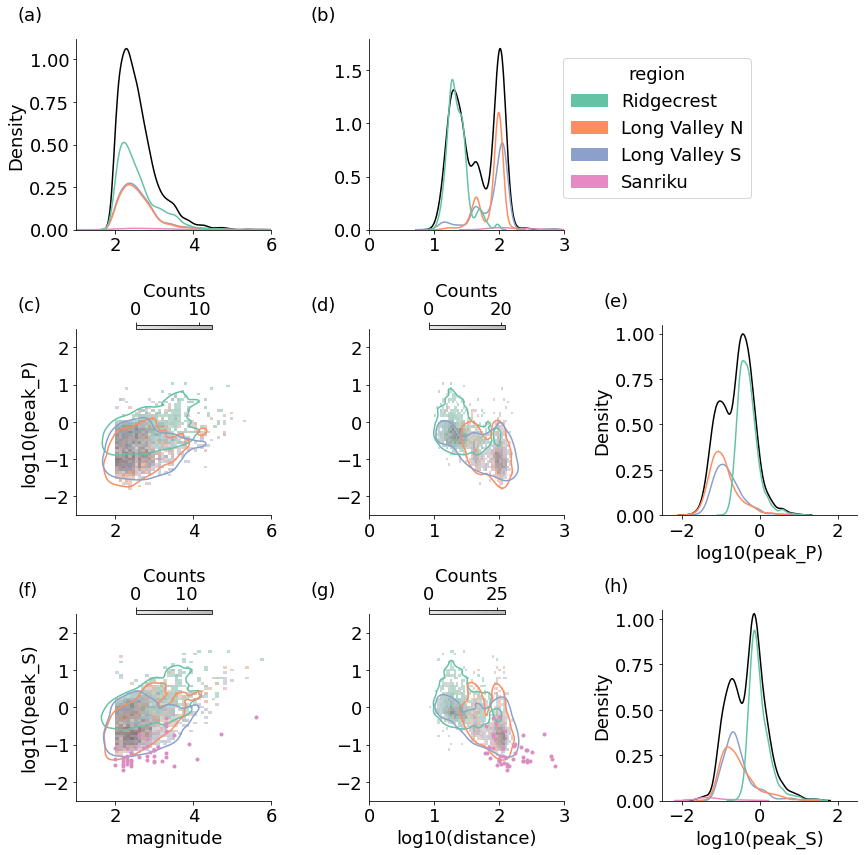

In [10]:
# %%
# =================================   New organization of data statistics (3 by 3) hist plot =================================  
# =================================   Merge events  =================================  
def adjust_region_order(peak_amplitude_df, region_keys):
    for ii, region_key in enumerate(region_keys):
        if ii == 0:
            peak_amplitude_df_temp = peak_amplitude_df[peak_amplitude_df.region == region_key]
        else:
            peak_amplitude_df_temp = pd.concat([peak_amplitude_df_temp, peak_amplitude_df[peak_amplitude_df.region == region_key]], axis=0)
    return peak_amplitude_df_temp
    
levels = 1
thresh = 0.05

bins = (40, 40)
add_possible_clipping = False
peak_amplitude_df_temp = peak_amplitude_df_all.iloc[::1, :]
peak_amplitude_df_temp = peak_amplitude_df_temp.groupby(by=['event_id', 'region'], as_index=False).median()

peak_amplitude_df_temp = adjust_region_order(peak_amplitude_df_temp, ['ridgecrest', 'mammothN', 'mammothS', 'sanriku'])


calibrated_distance = ''#'_calibrated_distance'
peak_amplitude_df_temp['log10(distance)'] = np.log10(peak_amplitude_df_temp.distance_in_km.astype('float'))
# peak_amplitude_df_temp['log10(distance)'] = np.log10(peak_amplitude_df_temp.distance_in_km.astype('float'))
peak_amplitude_df_temp['log10(peak_P)'] = np.log10(peak_amplitude_df_temp.peak_P.astype('float'))
peak_amplitude_df_temp['log10(peak_S)'] = np.log10(peak_amplitude_df_temp.peak_S.astype('float'))
peak_amplitude_df_temp['P/S'] = peak_amplitude_df_temp.peak_P/peak_amplitude_df_temp.peak_S

peak_amplitude_df_Sanriku = peak_amplitude_df_temp[peak_amplitude_df_temp.region == 'sanriku']
peak_amplitude_df_others = peak_amplitude_df_temp[peak_amplitude_df_temp.region != 'sanriku']

plt.close('all')
fig, ax = plt.subplots(3, 3, figsize=(14, 14))
gca = ax[0, 0]
g = sns.kdeplot(ax=gca, data=peak_amplitude_df_temp[['magnitude', 'region']], x='magnitude', color='k')
g = sns.kdeplot(ax=gca, data=peak_amplitude_df_temp[['magnitude', 'region']], x='magnitude', hue='region', palette='Set2', legend=False)
gca.set_xlim(1, 6)

gca = ax[0, 1]
g = sns.kdeplot(ax=gca, data=peak_amplitude_df_temp[['log10(distance)', 'region']], x='log10(distance)', color='k')
g = sns.kdeplot(ax=gca, data=peak_amplitude_df_temp[['log10(distance)', 'region']], x='log10(distance)', hue='region', palette='Set2', legend=False)
gca.set_xlim(0, 3)

gca = ax[1, 0]
# g = sns.scatterplot(ax=gca, data=peak_amplitude_df_temp[['magnitude','log10(peak_P)', 'region']], x='magnitude', y='log10(peak_P)', size=1,
#                  hue='region', palette='Set2', alpha=0.2, legend=False)
g = sns.histplot(ax=gca, data=peak_amplitude_df_temp[['magnitude','log10(peak_P)', 'region']], x='magnitude', y='log10(peak_P)',
                 color=".1", alpha=0.4, pmax=0.5, cbar=True, bins=bins, legend=False, cbar_kws={'location': 'top', 'fraction':0.02, 'pad':0, 'label':'Counts'})
g = sns.histplot(ax=gca, data=peak_amplitude_df_temp[['magnitude','log10(peak_P)', 'region']], x='magnitude', y='log10(peak_P)',
                 hue='region', palette='Set2', alpha=0.4, pmax=0.5, cbar=False, bins=bins, legend=True, fill=False)
g = sns.kdeplot(ax=gca, data=peak_amplitude_df_temp[['magnitude','log10(peak_P)', 'region']], x='magnitude', y='log10(peak_P)',
                 hue='region', palette='Set2', alpha=1, pmax=0.5, cbar=False, bins=bins, legend=False, fill=False, levels=levels, thresh=thresh)

gca.set_ylim(-2.5, 2.5)
g.get_legend().set_bbox_to_anchor((3.5, 2.5))
# update the legend text
L = g.get_legend()
for i_L in range(len(L.get_texts())):
    L.get_texts()[i_L].set_text(region_legend_text[i_L])

gca = ax[1, 1]
g = sns.histplot(ax=gca, data=peak_amplitude_df_temp[['log10(distance)','log10(peak_P)', 'region']], x='log10(distance)', y='log10(peak_P)',
                 color=".1", alpha=0.4, pmax=0.9, cbar=True, bins=bins, legend=False, cbar_kws={'location': 'top', 'fraction':0.02, 'pad':0, 'label':'Counts'})
g = sns.histplot(ax=gca, data=peak_amplitude_df_others[['log10(distance)','log10(peak_P)', 'region']], x='log10(distance)', y='log10(peak_P)',
                 hue='region', palette='Set2', alpha=0.4, pmax=0.9, cbar=False, bins=bins, legend=False)
g = sns.kdeplot(ax=gca, data=peak_amplitude_df_others[['log10(distance)','log10(peak_P)', 'region']], x='log10(distance)', y='log10(peak_P)',
                 hue='region', palette='Set2', alpha=1, pmax=0.9, cbar=False, bins=bins, legend=False, levels=levels, thresh=thresh)

gca = ax[2, 0]
g = sns.histplot(ax=gca, data=peak_amplitude_df_others[['magnitude','log10(peak_S)', 'region']], x='magnitude', y='log10(peak_S)',
                 color=".1", alpha=0.4, pmax=0.5, cbar=True, bins=bins, legend=False, cbar_kws={'location': 'top', 'fraction':0.02, 'pad':0, 'label':'Counts'})
g = sns.histplot(ax=gca, data=peak_amplitude_df_others[['magnitude','log10(peak_S)', 'region']], x='magnitude', y='log10(peak_S)',
                 hue='region', palette='Set2', alpha=0.4, pmax=0.5, cbar=False, bins=bins, legend=False)
g = sns.kdeplot(ax=gca, data=peak_amplitude_df_others[['magnitude','log10(peak_S)', 'region']], x='magnitude', y='log10(peak_S)',
                 hue='region', palette='Set2', alpha=1, pmax=0.5, cbar=False, bins=bins, legend=False, levels=levels, thresh=thresh)

gca.plot(peak_amplitude_df_Sanriku.magnitude.astype('float'), np.log10(peak_amplitude_df_Sanriku.peak_S.astype('float')), 'o', markersize=3, color='#DA8EC0', alpha=1)
gca.set_ylim(-2.5, 2.5)


gca = ax[2, 1]
g = sns.histplot(ax=gca, data=peak_amplitude_df_others[['log10(distance)','log10(peak_S)', 'region']], x='log10(distance)', y='log10(peak_S)',
                 color=".1", alpha=0.4, pmax=0.9, cbar=True, bins=bins, legend=False, cbar_kws={'location': 'top', 'fraction':0.02, 'pad':0, 'label':'Counts'})
g = sns.histplot(ax=gca, data=peak_amplitude_df_others[['log10(distance)','log10(peak_S)', 'region']], x='log10(distance)', y='log10(peak_S)',
                 hue='region', palette='Set2', alpha=0.4, pmax=0.9, cbar=False, bins=bins, legend=False)
g = sns.kdeplot(ax=gca, data=peak_amplitude_df_others[['log10(distance)','log10(peak_S)', 'region']], x='log10(distance)', y='log10(peak_S)',
                 hue='region', palette='Set2', alpha=1, pmax=0.5, cbar=False, bins=bins, legend=False, levels=levels, thresh=thresh)

gca.plot(np.log10(peak_amplitude_df_Sanriku.distance_in_km.astype('float')), np.log10(peak_amplitude_df_Sanriku.peak_S.astype('float')), 'o', markersize=3, color='#DA8EC0', alpha=1)

fig.delaxes(ax[0, 2])

gca = ax[1, 2]
g = sns.kdeplot(ax=gca, data=peak_amplitude_df_temp[['log10(peak_P)', 'region']], x='log10(peak_P)', color='k')
g = sns.kdeplot(ax=gca, data=peak_amplitude_df_temp[['log10(peak_P)', 'region']], x='log10(peak_P)', hue='region', palette='Set2', legend=False)
gca.set_xlim(-2.5, 2.5)

gca = ax[2, 2]
g = sns.kdeplot(ax=gca, data=peak_amplitude_df_temp[['log10(peak_S)', 'region']], x='log10(peak_S)', color='k')
g = sns.kdeplot(ax=gca, data=peak_amplitude_df_temp[['log10(peak_S)', 'region']], x='log10(peak_S)', hue='region', palette='Set2', legend=False)

# share x axis
ax[1, 0].sharex(ax[0, 0])
ax[2, 0].sharex(ax[0, 0])
ax[1, 1].sharex(ax[0, 1])
ax[2, 1].sharex(ax[0, 1])
ax[2, 2].sharex(ax[1, 2])

# share y axis
ax[1, 1].sharey(ax[1, 0])
ax[2, 1].sharey(ax[2, 0])
ax[2, 2].sharey(ax[1, 2])

# some final handling
letter_list = [str(chr(k+97)) for k in range(0, 20)]
k=0
for i_ax, gca in enumerate(ax.flatten()):
    gca.spines.right.set_visible(False)
    gca.spines.top.set_visible(False)
    # add annotation
    if i_ax != 2:
        gca.annotate(f'({letter_list[k]})', xy=(-0.3, 1.1), xycoords=gca.transAxes)
        k += 1
    # remove some labels
    if i_ax not in [0, 3, 6, 5, 8]:
        gca.set_ylabel('')
    if i_ax not in [5, 6, 7, 8]:
        gca.set_xlabel('')

plt.subplots_adjust(wspace=0.5, hspace=0.5)

plt.savefig(figure_output_dir + f'/data_correlation{calibrated_distance}_3x3_hist.png', bbox_inches='tight')


/home/yinjx/.conda/envs/das_data/lib/python3.8/site-packages/seaborn/distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


<Figure size 1008x576 with 0 Axes>

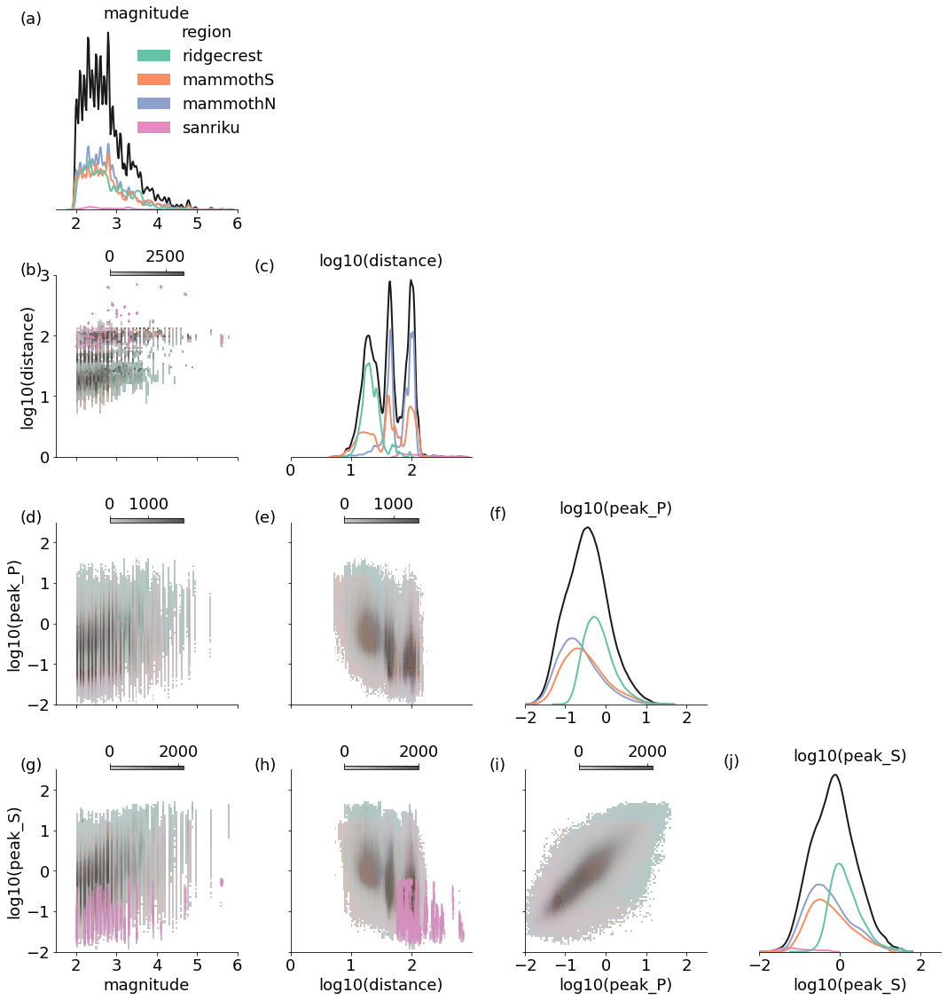

In [11]:
#%% 
#  =================================  plot data statistics (peak strain rate measurements) =================================  
peak_amplitude_df_temp = peak_amplitude_df_all.iloc[::1, :]
calibrated_distance = ''#'_calibrated_distance'
peak_amplitude_df_temp['log10(distance)'] = np.log10(peak_amplitude_df_temp.distance_in_km.astype('float'))
# peak_amplitude_df_temp['log10(distance)'] = np.log10(peak_amplitude_df_temp.distance_in_km.astype('float'))
peak_amplitude_df_temp['log10(peak_P)'] = np.log10(peak_amplitude_df_temp.peak_P.astype('float'))
peak_amplitude_df_temp['log10(peak_S)'] = np.log10(peak_amplitude_df_temp.peak_S.astype('float'))
peak_amplitude_df_temp['P/S'] = peak_amplitude_df_temp.peak_P/peak_amplitude_df_temp.peak_S


fig = plt.figure(figsize=(14,8))

g = sns.PairGrid(peak_amplitude_df_temp[['magnitude','log10(distance)', 'log10(peak_P)','log10(peak_S)', 'region']], 
                 diag_sharey=False, corner=True, hue='region', palette='Set2', height=4, aspect=0.8)


g.map_diag(sns.kdeplot, hue=None, color=".1", linewidth=2) #hue='Array', palette='Set2', 
g.map_diag(sns.kdeplot, linewidth=2, alpha=1) #hue='Array', palette='Set2', 

g.map_lower(sns.histplot, pmax=0.5, hue=None, color=".1", cbar=True, cbar_kws={'location': 'top', 'fraction':0.02, 'pad':0}, bins=80)
g.map_lower(sns.histplot, pmax=0.5, alpha=0.3, bins=80)

plt.subplots_adjust(hspace=0.2, wspace=0.25)

g.add_legend()
g._legend.set_bbox_to_anchor((0.3, 0.9))

# show the Sanriku data
peak_amplitude_df_Sanriku = peak_amplitude_df_temp[peak_amplitude_df_temp.region == 'sanriku']
g.axes[1,0].plot(peak_amplitude_df_Sanriku.magnitude, np.log10(peak_amplitude_df_Sanriku.distance_in_km), '.', markersize=1, color='#DA8EC0', alpha=0.3)
g.axes[3,0].plot(peak_amplitude_df_Sanriku.magnitude, np.log10(peak_amplitude_df_Sanriku.peak_S), '.', markersize=1, color='#DA8EC0', alpha=0.3)
g.axes[3,1].plot(np.log10(peak_amplitude_df_Sanriku.distance_in_km), np.log10(peak_amplitude_df_Sanriku.peak_S), '.', markersize=1, color='#DA8EC0', alpha=0.3)

g.axes[0,0].set_title('magnitude')
g.axes[0,0].tick_params(labelbottom=True)
g.axes[1,1].set_title('log10(distance)')
g.axes[1,1].tick_params(labelbottom=True)
g.axes[2,2].set_title('log10(peak_P)')
g.axes[2,2].tick_params(labelbottom=True)
g.axes[3,3].set_title('log10(peak_S)')
g.axes[3,3].tick_params(labelbottom=True)

g.axes[1,0].set_yticks(np.arange(0,10))
g.axes[1,0].set_ylim((0, 3))

g.axes[2,0].set_yticks(np.arange(-3,5))
g.axes[2,0].set_ylim((-2,2.5))
g.axes[2,1].set_ylim((-2,2.5))

g.axes[3,0].set_yticks(np.arange(-3,5))
g.axes[3,0].set_ylim((-2,2.5))
g.axes[3,1].set_ylim((-2,2.5))
g.axes[3,2].set_ylim((-2,2.5))
g.axes[3,2].set_xticks(np.arange(-3,5))
g.axes[3,2].set_xlim((-2,2.5))
g.axes[3,3].set_xlim((-2,2.5))

g.axes[2,0].set_xticks(np.arange(0,10))
g.axes[2,0].set_xlim(1.5, 6)
g.axes[2,1].set_xticks(np.arange(0,3,1))
g.axes[2,1].set_xlim((0, 3))
g.axes[3,1].set_xlim((0, 3)) # 2.3

# Adding annotation
letter_list = [str(chr(k+97)) for k in range(0, 20)]
k=0
for gca in g.axes.flatten():
    if gca is not None:
        gca.annotate(f'({letter_list[k]})', xy=(-0.2, 1.0), xycoords=gca.transAxes)
        k += 1

plt.tight_layout()
plt.savefig(figure_output_dir + f'/data_correlation{calibrated_distance}.png', bbox_inches='tight')

/home/yinjx/.conda/envs/das_data/lib/python3.8/site-packages/seaborn/distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


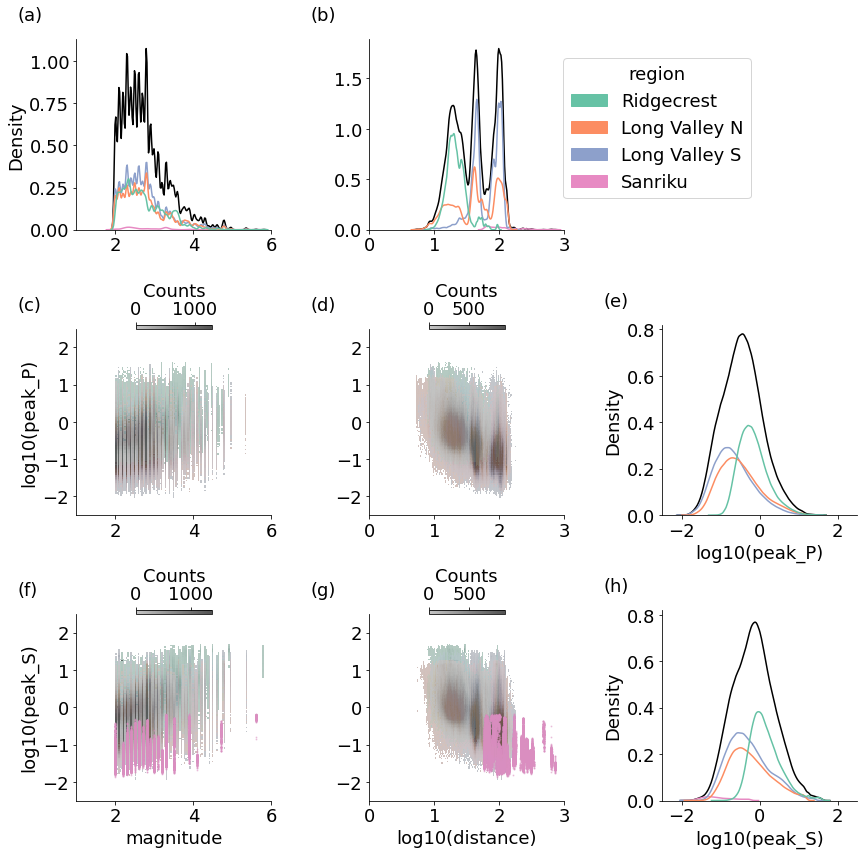

In [12]:
#%% 
# =================================   New organization of data statistics (3 by 3) (peak strain rate measurements) =================================  
bins = (100, 100)
add_possible_clipping = False
peak_amplitude_df_temp = peak_amplitude_df_all.iloc[::1, :]
calibrated_distance = ''#'_calibrated_distance'
peak_amplitude_df_temp['log10(distance)'] = np.log10(peak_amplitude_df_temp.distance_in_km.astype('float'))
# peak_amplitude_df_temp['log10(distance)'] = np.log10(peak_amplitude_df_temp.distance_in_km.astype('float'))
peak_amplitude_df_temp['log10(peak_P)'] = np.log10(peak_amplitude_df_temp.peak_P.astype('float'))
peak_amplitude_df_temp['log10(peak_S)'] = np.log10(peak_amplitude_df_temp.peak_S.astype('float'))
peak_amplitude_df_temp['P/S'] = peak_amplitude_df_temp.peak_P/peak_amplitude_df_temp.peak_S

peak_amplitude_df_Sanriku = peak_amplitude_df_temp[peak_amplitude_df_temp.region == 'sanriku']
peak_amplitude_df_others = peak_amplitude_df_temp[peak_amplitude_df_temp.region != 'sanriku']

plt.close('all')
fig, ax = plt.subplots(3, 3, figsize=(14, 14))
gca = ax[0, 0]
g = sns.kdeplot(ax=gca, data=peak_amplitude_df_temp[['magnitude', 'region']], x='magnitude', color='k')
g = sns.kdeplot(ax=gca, data=peak_amplitude_df_temp[['magnitude', 'region']], x='magnitude', hue='region', palette='Set2', legend=False)
gca.set_xlim(1, 6)

gca = ax[0, 1]
g = sns.kdeplot(ax=gca, data=peak_amplitude_df_temp[['log10(distance)', 'region']], x='log10(distance)', color='k')
g = sns.kdeplot(ax=gca, data=peak_amplitude_df_temp[['log10(distance)', 'region']], x='log10(distance)', hue='region', palette='Set2', legend=False)
gca.set_xlim(0, 3)

gca = ax[1, 0]
g = sns.histplot(ax=gca, data=peak_amplitude_df_temp[['magnitude','log10(peak_P)', 'region']], x='magnitude', y='log10(peak_P)',
                 color=".1", pmax=0.5, cbar=True, bins=bins, legend=False, cbar_kws={'location': 'top', 'fraction':0.02, 'pad':0, 'label':'Counts'})
g = sns.histplot(ax=gca, data=peak_amplitude_df_temp[['magnitude','log10(peak_P)', 'region']], x='magnitude', y='log10(peak_P)',
                 hue='region', palette='Set2', alpha=0.3, pmax=0.5, cbar=False, bins=bins, legend=True)
gca.set_ylim(-2.5, 2.5)
g.get_legend().set_bbox_to_anchor((3.5, 2.5))
# update the legend text
L = g.get_legend()
for i_L in range(len(L.get_texts())):
    L.get_texts()[i_L].set_text(region_legend_text[i_L])

gca = ax[1, 1]
g = sns.histplot(ax=gca, data=peak_amplitude_df_temp[['log10(distance)','log10(peak_P)', 'region']], x='log10(distance)', y='log10(peak_P)',
                 color=".1", pmax=0.5, cbar=True, bins=bins, legend=False, cbar_kws={'location': 'top', 'fraction':0.02, 'pad':0, 'label':'Counts'})
g = sns.histplot(ax=gca, data=peak_amplitude_df_temp[['log10(distance)','log10(peak_P)', 'region']], x='log10(distance)', y='log10(peak_P)',
                 hue='region', palette='Set2', alpha=0.3, pmax=0.5, cbar=False, bins=bins, legend=False)

gca = ax[2, 0]
g = sns.histplot(ax=gca, data=peak_amplitude_df_others[['magnitude','log10(peak_S)', 'region']], x='magnitude', y='log10(peak_S)',
                 color=".1", pmax=0.5, cbar=True, bins=bins, legend=False, cbar_kws={'location': 'top', 'fraction':0.02, 'pad':0, 'label':'Counts'})
g = sns.histplot(ax=gca, data=peak_amplitude_df_others[['magnitude','log10(peak_S)', 'region']], x='magnitude', y='log10(peak_S)',
                 hue='region', palette='Set2', alpha=0.3, pmax=0.5, cbar=False, bins=bins, legend=False)
gca.plot(peak_amplitude_df_Sanriku.magnitude.astype('float'), np.log10(peak_amplitude_df_Sanriku.peak_S.astype('float')), 'o', markersize=1, color='#DA8EC0', alpha=0.4)
gca.set_ylim(-2.5, 2.5)


gca = ax[2, 1]
g = sns.histplot(ax=gca, data=peak_amplitude_df_others[['log10(distance)','log10(peak_S)', 'region']], x='log10(distance)', y='log10(peak_S)',
                 color=".1", pmax=0.5, cbar=True, bins=bins, legend=False, cbar_kws={'location': 'top', 'fraction':0.02, 'pad':0, 'label':'Counts'})
g = sns.histplot(ax=gca, data=peak_amplitude_df_others[['log10(distance)','log10(peak_S)', 'region']], x='log10(distance)', y='log10(peak_S)',
                 hue='region', palette='Set2', alpha=0.3, pmax=0.5, cbar=False, bins=bins, legend=False)
gca.plot(np.log10(peak_amplitude_df_Sanriku.distance_in_km.astype('float')), np.log10(peak_amplitude_df_Sanriku.peak_S.astype('float')), 'o', markersize=1, color='#DA8EC0', alpha=0.4)

fig.delaxes(ax[0, 2])

gca = ax[1, 2]
g = sns.kdeplot(ax=gca, data=peak_amplitude_df_temp[['log10(peak_P)', 'region']], x='log10(peak_P)', color='k')
g = sns.kdeplot(ax=gca, data=peak_amplitude_df_temp[['log10(peak_P)', 'region']], x='log10(peak_P)', hue='region', palette='Set2', legend=False)
gca.set_xlim(-2.5, 2.5)

gca = ax[2, 2]
g = sns.kdeplot(ax=gca, data=peak_amplitude_df_temp[['log10(peak_S)', 'region']], x='log10(peak_S)', color='k')
g = sns.kdeplot(ax=gca, data=peak_amplitude_df_temp[['log10(peak_S)', 'region']], x='log10(peak_S)', hue='region', palette='Set2', legend=False)

# share x axis
ax[1, 0].sharex(ax[0, 0])
ax[2, 0].sharex(ax[0, 0])
ax[1, 1].sharex(ax[0, 1])
ax[2, 1].sharex(ax[0, 1])
ax[2, 2].sharex(ax[1, 2])

# share y axis
ax[1, 1].sharey(ax[1, 0])
ax[2, 1].sharey(ax[2, 0])
ax[2, 2].sharey(ax[1, 2])

# some final handling
letter_list = [str(chr(k+97)) for k in range(0, 20)]
k=0
for i_ax, gca in enumerate(ax.flatten()):
    gca.spines.right.set_visible(False)
    gca.spines.top.set_visible(False)
    # add annotation
    if i_ax != 2:
        gca.annotate(f'({letter_list[k]})', xy=(-0.3, 1.1), xycoords=gca.transAxes)
        k += 1
    # remove some labels
    if i_ax not in [0, 3, 6, 5, 8]:
        gca.set_ylabel('')
    if i_ax not in [5, 6, 7, 8]:
        gca.set_xlabel('')

plt.subplots_adjust(wspace=0.5, hspace=0.5)

plt.savefig(figure_output_dir + f'/data_correlation{calibrated_distance}_3x3.png', bbox_inches='tight')